# Capstone Project: The Battle of Neighborhoods

# Analysis of San Francisco Neighborhoods

## Table of Contents

[1. Introduction](#item1)

[2. Data](#item2)

[3. Methodology](#item3)

[4. Results & Discussion](#item4)

[5. Conclusion](#item5)

## 1. Introduction <a name="item1"></a>

### 1.1 Background

San Francisco is one of the United States' most well known cities. It is the cultural, commercial, and financial center of Northern California and is famous for its iconic Golden Gate Bridge and cable cars. As a popular tourist destination and the headquarters for numerous major international companies and banks, the city is an important global center that attracts people from far and wide to make a living there. 

Before making the move to start a business, it is important to familiarize oneself with the areas and neighborhoods of a city as diverse as San Francisco. Prospective business owners must first understand the best location where their business will be successful. The neighborhood a small business is in will most certainly impact the number of customers it will have. In terms of location, three of the most important factors that will influence the success of a business are: 
1. Finding the location that is best suited for the business's intended target market.
2. Understanding the location's area traffic.
3. Finding a location that provides easy accessibility and visibility.

Of course, there are various other important factors to consider, such as the cost of rent or the crime index of a location. However, this report will focus on the three factors that were listed above to provide some preliminary insight on where one should start a new business in San Francisco. It should also be noted that although this study is focused on the city of San Francisco, the same ideas and approach can be applied to other cities as well.

### 1.2 Business Problem: Where should JB open an Indian-Italian fusion cuisine restaurant in San Francisco? 

A college friend of mine, JB, expressed interest in opening a new Indian-Italian fusion cuisine restaurant in San Francisco. She is drawn to the city by its lively multicultural atmosphere and wishes to contribute to this melting pot. However, since there are so many neighborhoods in San Francisco, each with their own distinct area traffic and demographics of people, she is puzzled by where to start looking first. As such, JB is interested in learning more about each neighborhood and has stated several facts about her intended restaurant to help with the analysis. Her restaurant:
- Should appeal to everyone (locals and tourists alike).
- Is unique and stands out.
- Will primarily serve lunch and dinner.
- Will be moderately priced (~$$$).

This report will use data science methods to identify the most promising neighborhoods for JB to start exploring for her new restaurant. The study will consider JB's intended market criteria based on the three location factors as listed in the *Background* section.

## 2. Data <a name="item2"></a>

This section will provide a description of the data and how it will be used to solve the stated business problem.

### 2.1 Description of the Data

The following data was used to study the neighborhoods of San Francisco:

1. **San Francisco GeoJSON**: Contains the neighborhoods that exist in San Francisco as well as their respective latitude and longitude coordinates. This data was sourced from: https://data.sfgov.org/Geographic-Locations-and-Boundaries/SF-Find-Neighborhoods/pty2-tcw4.
2. **Venues in San Francisco**: A collection of all the venues in San Francisco, named *venues_df*. The dataset was pulled using the **Foursquare** API and includes each venue's name, what neighborhood they're in, their respective latitude and longitude coordinates, and their respective venue category.

### 2.2 How the Data Will Be Used to Solve the Business Problem

Exploratory data analysis will be performed to understand the two datasets in order to solve the business problem.

The San Francisco GeoJSON data will be used to show the neighborhood shapes. Each neighborhood's "coordinates" of the geometry object is composed of a multipolygon which is a multidimensional array of positions. Modifications were performed on the GeoJSON data to transform it into a polygon format that is easier to use for further analysis. This step was done before loading the data into this notebook.

The Venues in San Francisco data will be used for finding all of the commerce venues associated with each neighborhood. As we are trying to understand each neighborhood's area traffic and potential to be a suitable market location that satisfies JB's criterias, the commerce venues information is used to get an impression of the kinds of people that frequent each neighborhood.

In the analysis, folium will be used to visualize San Francisco and the locations of each venue of interest. One hot encoding will be used to divide the commerce venues into: Business Offices, Colleges, Hotels, Public Areas, Restaurants, Shopping Areas, and Social Places. This subdivision will allow us to analyze what commerce types each neighborhood is known for so we can better determine the one that is best suited for JB's restaurant. Finally, K-means clustering will be used on the venues dataset to see what venue categories can be used to distinguish each neighborhood cluster.

## 3. Methodology <a name="item3"></a>

This section represents the main component of the report where I will detail the exploratory data analysis that was done, the inferential statistical testing that was performed, and the k-means clustering machine learning that was used.

### 3.1 Python Libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans
from sklearn import metrics

from scipy.spatial.distance import cdist

import folium # map rendering library

print('Libraries imported.')

Libraries imported.


### 3.2 Data Preparation - San Francisco GeoJSON

Load the San Francisco GeoJSON data which includes each neighborhood's name and their respective latitudes and longitudes.

In [2]:
# Open JSON file 
f = open('SF.geojson',) 
  
# Return JSON object as a dictionary 
f_data = json.load(f)
f_data

{'type': 'FeatureCollection',
 'features': [{'type': 'Feature',
   'properties': {'link': 'http://en.wikipedia.org/wiki/Sea_Cliff,_San_Francisco,_California',
    'name': 'Seacliff'},
   'geometry': {'type': 'Polygon',
    'coordinates': [[[-122.49345526799993, 37.78351817100008],
      [-122.49372649999992, 37.78724665100009],
      [-122.49358666699993, 37.78731259500006],
      [-122.49360569399994, 37.78752774600008],
      [-122.49283007399993, 37.787882585000034],
      [-122.4927566799999, 37.78773917700005],
      [-122.48982906399993, 37.789482184000065],
      [-122.48899105699991, 37.78928318700008],
      [-122.4878640209999, 37.78958817900008],
      [-122.48736904899994, 37.78942984100007],
      [-122.48598032899991, 37.79080370600008],
      [-122.48581537399991, 37.79070384600004],
      [-122.48557750799989, 37.790559847000054],
      [-122.4850531269999, 37.79036813300007],
      [-122.4842660519999, 37.789411709000035],
      [-122.48407706799992, 37.78939909400009]

Notice that all of the relevant data is in the *features* key, which is basically a list of the neighborhoods. So, let's define a new variable that includes this data and then look at the first item in this list.

In [3]:
sf_data = f_data['features']
sf_data[0]

{'type': 'Feature',
 'properties': {'link': 'http://en.wikipedia.org/wiki/Sea_Cliff,_San_Francisco,_California',
  'name': 'Seacliff'},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[-122.49345526799993, 37.78351817100008],
    [-122.49372649999992, 37.78724665100009],
    [-122.49358666699993, 37.78731259500006],
    [-122.49360569399994, 37.78752774600008],
    [-122.49283007399993, 37.787882585000034],
    [-122.4927566799999, 37.78773917700005],
    [-122.48982906399993, 37.789482184000065],
    [-122.48899105699991, 37.78928318700008],
    [-122.4878640209999, 37.78958817900008],
    [-122.48736904899994, 37.78942984100007],
    [-122.48598032899991, 37.79080370600008],
    [-122.48581537399991, 37.79070384600004],
    [-122.48557750799989, 37.790559847000054],
    [-122.4850531269999, 37.79036813300007],
    [-122.4842660519999, 37.789411709000035],
    [-122.48407706799992, 37.78939909400009],
    [-122.4838230019999, 37.78928250300004],
    [-122.48370738599994, 37.788776

Tranform this data of nested Python dictionaries into a _pandas_ dataframe.

In [4]:
# Define the dataframe columns
column_names = ['Neighborhood','Geometry']

# Instantiate the dataframe
neighborhoods_data = pd.DataFrame(columns=column_names)

for data in sf_data:
    neighborhood_name = data['properties']['name']
    neighborhood_latlon = data['geometry']['coordinates']
    
    neighborhoods_data = neighborhoods_data.append({'Neighborhood': neighborhood_name,
                                                    'Geometry': neighborhood_latlon}, ignore_index=True)

neighborhoods_data.head()

,Neighborhood,Geometry
0,Seacliff,"[[[-122.49345526799993, 37.78351817100008], [-..."
1,Lake Street,"[[[-122.48715071499993, 37.783785427000055], [..."
2,Presidio National Park,"[[[-122.47758017099994, 37.81099311300005], [-..."
3,Presidio Terrace,"[[[-122.47241052999993, 37.787346539000055], [..."
4,Inner Richmond,"[[[-122.47262578999994, 37.786314806000064], [..."


Let's see how many neighborhoods are in San Francisco.

In [5]:
print("The dataframe has {} neighborhoods.".format(len(neighborhoods_data['Neighborhood'].unique())))

The dataframe has 117 neighborhoods.


From each neighborhood's geometry, let's calculate their respective centroid coordinates.

In [6]:
neighborhoods_data['Centroid'] = neighborhoods_data['Geometry'].apply(lambda inp: [[sum(m)/float(len(m)) for m in zip(*l)] for l in inp])
neighborhoods_data['Centroid'] = neighborhoods_data['Centroid'].apply(np.ravel) # flatten the nested list into one single list
neighborhoods_data['Centroid'] = neighborhoods_data['Centroid'].apply(tuple) # convert list to tuple

In [7]:
# Separate the centroid tuples into latitude and longitude columns
neighborhoods_data[['Longitude', 'Latitude']] = pd.DataFrame(neighborhoods_data['Centroid'].tolist(), index=neighborhoods_data.index)

Quickly examine the resulting dataframe.


In [8]:
neighborhoods_data.head()

,Neighborhood,Geometry,Centroid,Longitude,Latitude
0,Seacliff,"[[[-122.49345526799993, 37.78351817100008], [-...","(-122.48727411196657, 37.78794365720007)",-122.487274,37.787944
1,Lake Street,"[[[-122.48715071499993, 37.783785427000055], [...","(-122.48056858607683, 37.78615137738468)",-122.480569,37.786151
2,Presidio National Park,"[[[-122.47758017099994, 37.81099311300005], [-...","(-122.46797365011281, 37.79926798262909)",-122.467974,37.799268
3,Presidio Terrace,"[[[-122.47241052999993, 37.787346539000055], [...","(-122.46795748666659, 37.78692981188894)",-122.467957,37.786930
4,Inner Richmond,"[[[-122.47262578999994, 37.786314806000064], [...","(-122.46875409127264, 37.7811122254546)",-122.468754,37.781112


In [9]:
neighborhoods_data.dtypes

Neighborhood     object
Geometry         object
Centroid         object
Longitude       float64
Latitude        float64
dtype: object

### 3.3 Data Collection - Coordinates of San Francisco

#### Use geopy library to get the latitude and longitude values of San Francisco.

In order to define an instance of the geocoder, we need to define a user_agent. We will name our agent <em>sf_explorer</em>.


In [10]:
address = 'San Francisco, CA'

geolocator = Nominatim(user_agent="sf_explorer")
location = geolocator.geocode(address, timeout=None)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of San Francisco are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of San Francisco are 37.7790262, -122.4199061.


Create a map of San Francisco with the neighborhood centroids superimposed on top.

In [11]:
# Create map of San Francisco using latitude and longitude values
map_sanfrancisco = folium.Map(location=[latitude, longitude], zoom_start=12)

# Add markers to map
for lat, lng, neighborhood in zip(neighborhoods_data['Latitude'], neighborhoods_data['Longitude'], neighborhoods_data['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker([lat, lng],
                        radius=5,
                        popup=label,
                        color='blue',
                        fill=True,
                        fill_color='#3186cc',
                        fill_opacity=0.7,
                        parse_html=False).add_to(map_sanfrancisco)  
    
map_sanfrancisco

Feel free to zoom into the above map, and click on each circle marker to reveal the name of the neighborhood.

Next, we are going to start utilizing the **Foursquare** API to explore the neighborhoods and segment them.

### 3.4 Data Collection - Venues in San Francisco

#### Use Foursquare API to get the venues

Define Foursquare credentials and version.

In [12]:
CLIENT_ID = '...'
CLIENT_SECRET = '...'
VERSION = '20190605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

Create the functions that will extract the data from Foursquare.

In [13]:
# Function that extracts the venue
def get_Venues(neighborhood, latitude, longitude, category=None, radius=1000):
    
    venues_list = []
    params = {'client_id': CLIENT_ID,
              'client_secret': CLIENT_SECRET,
              'v': VERSION,
              'll': '{},{}'.format(latitude, longitude),
              'radius': radius,
              'limit': LIMIT}
    url = 'https://api.foursquare.com/v2/venues/search'
    results = requests.get(url, params=params).json()
    
    if not results['response']:
        return []

    for v in results['response']['venues']:
        if not v['categories']:
            continue
        venues_list.append([neighborhood,
                            latitude, 
                            longitude, 
                            v['name'], 
                            v['location']['lat'], 
                            v['location']['lng'],
                            v['categories'][0]["name"]])
    return venues_list

In [14]:
def get_NearbyVenues(neighborhoods, latitudes, longitudes, category=None, radius=1000):
    
    venues_list = []
    for neig, lat, lng in zip(neighborhoods, latitudes, longitudes):
        results = get_Venues(neig, lat, lng, category=category, radius=radius)
        venues_list += results
        
    if not venues_list:
        print("venue list is empty")
        return []
    
    venues_data = pd.DataFrame(venue for venue in venues_list)
    venues_data.columns = ['Neighborhood', 
                           'Neighborhood Latitude', 
                           'Neighborhood Longitude', 
                           'Venue', 
                           'Venue Latitude', 
                           'Venue Longitude',
                           'Venue Category',]
    
    return venues_data

Now pull each neighborhood's data into a dataframe called *venues_df*. This will become our **Venues in San Francisco** data.

In [15]:
venues_df = get_NearbyVenues(neighborhoods=neighborhoods_data['Neighborhood'],
                            latitudes=neighborhoods_data['Latitude'],
                            longitudes=neighborhoods_data['Longitude'])
venues_df

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Seacliff,37.787944,-122.487274,Baker Beach,37.793355,-122.483740,Beach
1,Seacliff,37.787944,-122.487274,China Beach,37.788090,-122.491186,Beach
2,Seacliff,37.787944,-122.487274,UC San Francisco,37.789087,-122.487971,College Administrative Building
3,Seacliff,37.787944,-122.487274,Lands End Coastal Trail,37.784183,-122.509022,Trail
4,Seacliff,37.787944,-122.487274,Lincoln Park Stairs,37.783496,-122.493597,Trail
5,Seacliff,37.787944,-122.487274,MUNI Bus Stop #13839,37.783956,-122.484822,Bus Stop
6,Seacliff,37.787944,-122.487274,El Camino del Mar Trail,37.786568,-122.494399,Trail
7,Seacliff,37.787944,-122.487274,Muni 13838,37.783792,-122.485390,Bus Station
8,Seacliff,37.787944,-122.487274,Lobos Creek,37.786981,-122.485191,Other Great Outdoors
9,Seacliff,37.787944,-122.487274,Pearl,37.783839,-122.483083,Restaurant


### 3.5 Exploratory Data Analysis

#### 3.5.1 Get the Relevant Venues

Check how many venues were returned for each neighborhood.

In [16]:
venues_df.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
Alamo Square,64,64,64,64,64,64
Anza Vista,96,96,96,96,96,96
Apparel City,90,90,90,90,90,90
Aquatic Park / Ft. Mason,99,99,99,99,99,99
Ashbury Heights,78,78,78,78,78,78
Balboa Terrace,92,92,92,92,92,92
Bayview,94,94,94,94,94,94
Bernal Heights,87,87,87,87,87,87
Bret Harte,70,70,70,70,70,70


Check how many unique categories can be curated from all the returned venues.


In [17]:
print('There are {} uniques categories.'.format(len(venues_df['Venue Category'].unique())))

There are 528 uniques categories.


Now that we know there are 528 unique venue categories, let's only use those that are relevant to satisfying the 3 location factors as stated in the *Background* section. 

To begin, we refer back to JB's criterias list for her restaurant. She stated that her restaurant would cater to both locals and tourists. From this valuable information, we can narrow down our venues category list to those venues that are frequented by both locals and tourists alike. First, we know that tourists must reside inside hotels, motels, or resorts so let's group all of those venues together into a *Hotels* category. Next, we know that both locals and tourists love to eat at restaurants, shop, mingle in social places like bars, clubs, and other nightlife venues, and visit public spaces like parks, beaches, or San Francisco's piers. Therefore, we will find all of the venues that fall within the *Restaurants*, *Shopping Areas*, *Social Places*, and *Public Areas* categories. But now, what are the specific venues that only locals usually frequent? Of course, locals would go to any venue within their hometown but we know that office buildings and other business places are most usually frequented by locals who work in the city. We also can't forget about the university students who go to school and live inside the city. As such, we will include all venues that are related to both of those into *Business Offices* and *Colleges*. 

Great, now that we have a list of these "commerce venues", let's create a dataframe called *commerce_venues_df* that contains all of the venues we just determined which will be useful in our analysis.

In [18]:
# Define a dataframe that contains all of the venues of interest as described above.
commerce_venues_df = venues_df[(venues_df['Venue Category'].str.contains('Bakery')==True) |
                               (venues_df['Venue Category'].str.contains('Bar')==True) |
                               (venues_df['Venue Category'].str.contains('Beach')==True) |
                               (venues_df['Venue Category'].str.contains('Bistro')==True) |
                               (venues_df['Venue Category'].str.contains('Breakfast')==True) |
                               (venues_df['Venue Category'].str.contains('Burger Joint')==True) |
                               (venues_df['Venue Category'].str.contains('Burrito Place')==True) |
                               (venues_df['Venue Category'].str.contains('Business')==True) |
                               (venues_df['Venue Category'].str.contains('Café')==True) |
                               (venues_df['Venue Category'].str.contains('College')==True) |
                               (venues_df['Venue Category'].str.contains('Creperie')==True) |
                               (venues_df['Venue Category'].str.contains('Diner')==True) |
                               (venues_df['Venue Category'].str.contains('Food')==True) |
                               (venues_df['Venue Category'].str.contains('Fried Chicken Joint')==True) |
                               (venues_df['Venue Category'].str.contains('Gastropub')==True) |
                               (venues_df['Venue Category'].str.contains('Harbor / Marina')==True) |
                               (venues_df['Venue Category'].str.contains('Hotel')==True) |
                               (venues_df['Venue Category'].str.contains('Mac & Cheese Joint')==True) |
                               (venues_df['Venue Category'].str.contains('Market')==True) |
                               (venues_df['Venue Category'].str.contains('Motel')==True) |
                               (venues_df['Venue Category'].str.contains('Nightclub')==True) |
                               (venues_df['Venue Category'].str.contains('Nightlife Spot')==True) |
                               (venues_df['Venue Category'].str.contains('Noodle House')==True) |
                               (venues_df['Venue Category'].str.contains('Office')==True) |
                               (venues_df['Venue Category'].str.contains('Park')==True) |
                               (venues_df['Venue Category'].str.contains('Parking')==True) |
                               (venues_df['Venue Category'].str.contains('Pier')==True) |
                               (venues_df['Venue Category'].str.contains('Pizza Place')==True) |
                               (venues_df['Venue Category'].str.contains('Plaza')==True) |
                               (venues_df['Venue Category'].str.contains('Pub')==True) |
                               (venues_df['Venue Category'].str.contains('Resort')==True) |
                               (venues_df['Venue Category'].str.contains('Restaurant')==True) |
                               (venues_df['Venue Category'].str.contains('Salad Place')==True) |
                               (venues_df['Venue Category'].str.contains('Sandwich Place')==True) |
                               (venues_df['Venue Category'].str.contains('Shop')==True) |
                               (venues_df['Venue Category'].str.contains('Shopping Mall')==True) |
                               (venues_df['Venue Category'].str.contains('Steakhouse')==True) |
                               (venues_df['Venue Category'].str.contains('Store')==True) |
                               (venues_df['Venue Category'].str.contains('Supermarket')==True) |
                               (venues_df['Venue Category'].str.contains('Taco Place')==True)].reset_index(drop=True)

We've isolated data that satisfies one of JB's criterias where she wants to serve both locals and tourists. Next, let's move on to meeting her second requirement, the one where she wants her restaurant to be unique and stand out among other restaurants in the area. The first logical step is to take a look at all of the different restaurants and eateries that are in San Francisco. Then, because we know JB's restaurant will serve Indian-Italian fusion cuisine, we will study where each Indian and Italian restaurant in the city is located and eventually try to pick a neighborhood that does not have one of those restaurant types to maximize her restaurant's uniqueness in the area.

In [19]:
# Define a dataframe that just contains the restaurants and foodservice venues
restaurants_df = commerce_venues_df[(commerce_venues_df['Venue Category'].str.contains('Restaurant')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Bagel Shop')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Bistro')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Breakfast')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Burger Joint')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Burrito Place')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Café')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Creperie')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Dessert Shop')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Diner')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Food')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Fried Chicken Joint')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Gastropub')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Mac & Cheese Joint')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Noodle House')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Pizza Place')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Pub')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Salad Place')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Sandwich Place')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Sandwich Shop')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Steakhouse')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Souvlaki Shop')==True) |
                                    (commerce_venues_df['Venue Category'].str.contains('Taco Place')==True)].reset_index(drop=True)
restaurants_df

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Seacliff,37.787944,-122.487274,Pearl,37.783839,-122.483083,Restaurant
1,Seacliff,37.787944,-122.487274,Pizzetta 211,37.783694,-122.482879,Pizza Place
2,Seacliff,37.787944,-122.487274,Little Sushi Bar,37.783873,-122.482761,Sushi Restaurant
3,Seacliff,37.787944,-122.487274,Ocean Side Mexican Grill,37.784411,-122.480892,Mexican Restaurant
4,Seacliff,37.787944,-122.487274,Angelina's Cafe,37.784074,-122.481809,Café
5,Lake Street,37.786151,-122.480569,Pearl,37.783839,-122.483083,Restaurant
6,Lake Street,37.786151,-122.480569,Bazaar Cafe,37.784050,-122.481320,Café
7,Lake Street,37.786151,-122.480569,Fiorella,37.781887,-122.484510,Italian Restaurant
8,Lake Street,37.786151,-122.480569,Angelina's Cafe,37.784074,-122.481809,Café
9,Lake Street,37.786151,-122.480569,Pizzetta 211,37.783694,-122.482879,Pizza Place


In [20]:
# Define dataframes that just contain Indian and Italian restaurants
indian_restaurants_df = restaurants_df[restaurants_df['Venue Category'] == 'Indian Restaurant']
italian_restaurants_df = restaurants_df[restaurants_df['Venue Category'].isin(['Italian Restaurant', 'Pizza Place'])]

# All other restaurants and foodservice venues
other_restaurants_df = restaurants_df[(restaurants_df['Venue Category'] != 'Indian Restaurant') & (restaurants_df['Venue Category'] != 'Italian Restaurant') & (restaurants_df['Venue Category'] != 'Pizza Place')]

The distribution of Indian and Italian restaurants within San Francisco will now be visualized. The color code is set as follows: 

Restaurant | Color      
---|--------------------
Indian    |	green   
Italian   |	orange   
Other     |	gray   

In [21]:
# Create map of San Francisco using latitude and longitude values
map_sanfrancisco = folium.Map(location=[latitude, longitude], zoom_start=12)
restaurants = folium.map.FeatureGroup()

# Add markers to map
for lat, lng, venue, neigh in zip(other_restaurants_df['Venue Latitude'], other_restaurants_df['Venue Longitude'], other_restaurants_df['Venue'], other_restaurants_df['Neighborhood']):
    label = 'Name: {}, Neighborhood: {}'.format(venue, neigh)
    label = folium.Popup(label, parse_html=True)
    restaurants.add_child(folium.CircleMarker([lat, lng],
                                              radius=2,
                                              popup=label,
                                              color='gray',
                                              fill=True,
                                              fill_color='#c0c0c0',
                                              fill_opacity=0.7,)
                         )
for lat, lng, venue, neigh in zip(italian_restaurants_df['Venue Latitude'], italian_restaurants_df['Venue Longitude'], italian_restaurants_df['Venue'], italian_restaurants_df['Neighborhood']):
    label = 'Name: {}, Neighborhood: {}'.format(venue, neigh)
    label = folium.Popup(label, parse_html=True)
    restaurants.add_child(folium.CircleMarker([lat, lng],
                                              radius=3,
                                              popup=label,
                                              color='orange',
                                              fill=True,
                                              fill_color='#cc9831',
                                              fill_opacity=0.7,)
                         )
for lat, lng, venue, neigh in zip(indian_restaurants_df['Venue Latitude'], indian_restaurants_df['Venue Longitude'], indian_restaurants_df['Venue'], indian_restaurants_df['Neighborhood']):
    label = 'Name: {}, Neighborhood: {}'.format(venue, neigh)
    label = folium.Popup(label, parse_html=True)
    restaurants.add_child(folium.CircleMarker([lat, lng],
                                              radius=3,
                                              popup=label,
                                              color='green',
                                              fill=True,
                                              fill_color='#31cc5a',
                                              fill_opacity=0.7,)
                         )
map_sanfrancisco.add_child(restaurants)
map_sanfrancisco

From the map of San Francisco above, we can see where each Indian and Italian restaurant is located. Please click on the markers to view the name of the restaurant and the neighborhood that it is in.

#### 3.5.2 Analyze Each Neighborhood

We will now analyze each neighborhood to get a better understanding of them and finally prepare a list of most suitable neighborhoods for JB to start looking into.

Apply one hot encoding to the list of venue categories such that a new binary variable is added for each unique venue category per row.

In [22]:
# One hot encoding
sf_onehot = pd.get_dummies(commerce_venues_df[['Venue Category']], prefix="", prefix_sep="")

# Add neighborhood column back to dataframe
sf_onehot['Neighborhood'] = commerce_venues_df['Neighborhood'] 

# Move neighborhood column to the first column
fixed_columns = [sf_onehot.columns[-1]] + list(sf_onehot.columns[:-1])
sf_onehot = sf_onehot[fixed_columns]

sf_onehot.head()

,Neighborhood,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Argentinian Restaurant,Arts & Crafts Store,Asian Restaurant,Automotive Shop,Baby Store,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Big Box Store,Bike Shop,Bistro,Board Shop,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Burger Joint,Burmese Restaurant,Burrito Place,Business Center,Business Service,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Cricket Pitch,College Engineering Building,College Gym,College Lab,College Library,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,Comfort Food Restaurant,Comic Shop,Community College,Convenience Store,Corporate Coffee Shop,Cosmetics Shop,Costume Shop,Creperie,Cupcake Shop,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doctor's Office,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gastropub,Gay Bar,General College & University,German Restaurant,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health Food Store,Hobby Shop,Hookah Bar,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Insurance Office,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Leather Goods Store,Lighting Store,Lingerie Store,Liquor Store,Market,Mattress Store,Mediterranean Restaurant,Men's Store,Mental Health Office,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Motorcycle Shop,Music Store,National Park,New American Restaurant,Nightclub,Nightlife Spot,Noodle House,Office,Optical Shop,Other Repair Shop,Outdoor Supply Store,Paper / Office Supplies Store,Park,Parking,Pedestrian Plaza,Perfume Shop,Persian Restaurant,Peruvian Restaurant,Pet Store,Piano Bar,Pier,Pizza Place,Plaza,Pop-Up Shop,Post Office,Print Shop,Pub,Public Art,Public Bathroom,RV Park,Ramen Restaurant,Real Estate Office,Record Shop,Resort,Restaurant,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Sicilian Restaurant,Skate Park,Smoke Shop,Smoothie Shop,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spanish Restaurant,Sporting Goods Shop,Sports Bar,State / Provincial Park,Stationery Store,Steakhouse,Street Food Gathering,Supermarket,Supplement Shop,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tailor Shop,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theme Park,Thrift / Vintage Store,Tibetan Restaurant,Toy / Game Store,Trailer Park,Vape Store,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Women's Store
0,Seacliff,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

Examine the new dataframe size.


In [23]:
sf_onehot.shape

(4035, 247)

Next, group rows by neighborhood and count the frequency of occurrence of each category.

In [24]:
sf_grouped = sf_onehot.groupby('Neighborhood').sum().reset_index()
sf_grouped

,Neighborhood,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Argentinian Restaurant,Arts & Crafts Store,Asian Restaurant,Automotive Shop,Baby Store,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Beer Bar,Big Box Store,Bike Shop,Bistro,Board Shop,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Burger Joint,Burmese Restaurant,Burrito Place,Business Center,Business Service,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Cricket Pitch,College Engineering Building,College Gym,College Lab,College Library,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,Comfort Food Restaurant,Comic Shop,Community College,Convenience Store,Corporate Coffee Shop,Cosmetics Shop,Costume Shop,Creperie,Cupcake Shop,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doctor's Office,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gastropub,Gay Bar,General College & University,German Restaurant,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health Food Store,Hobby Shop,Hookah Bar,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Insurance Office,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Leather Goods Store,Lighting Store,Lingerie Store,Liquor Store,Market,Mattress Store,Mediterranean Restaurant,Men's Store,Mental Health Office,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Motorcycle Shop,Music Store,National Park,New American Restaurant,Nightclub,Nightlife Spot,Noodle House,Office,Optical Shop,Other Repair Shop,Outdoor Supply Store,Paper / Office Supplies Store,Park,Parking,Pedestrian Plaza,Perfume Shop,Persian Restaurant,Peruvian Restaurant,Pet Store,Piano Bar,Pier,Pizza Place,Plaza,Pop-Up Shop,Post Office,Print Shop,Pub,Public Art,Public Bathroom,RV Park,Ramen Restaurant,Real Estate Office,Record Shop,Resort,Restaurant,Russian Restaurant,Sake Bar,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Sicilian Restaurant,Skate Park,Smoke Shop,Smoothie Shop,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Spanish Restaurant,Sporting Goods Shop,Sports Bar,State / Provincial Park,Stationery Store,Steakhouse,Street Food Gathering,Supermarket,Supplement Shop,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tailor Shop,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theme Park,Thrift / Vintage Store,Tibetan Restaurant,Toy / Game Store,Trailer Park,Vape Store,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Water Park,Whisky Bar,Wine Bar,Wine Shop,Women's Store
0,Alamo Square,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,

Confirm the new size.


In [25]:
sf_grouped.shape

(117, 247)

Now, let's sort each venue into their overarching commerce venue group and count the number of each group by neighborhood. These groups include: Business Offices, Colleges, Hotels, Public Areas, Restaurants, Shopping Areas, and Social Places.

In [26]:
# Create a reference dataframe that contains the same indexing as sf_grouped
sf_grouped_sum = pd.DataFrame()
sf_grouped_sum = sf_grouped.iloc[:, :1]

# Create a separate dataframe for each category containing the sum of the specific category
col_businessOffices = [i for i in sf_grouped.columns if 'Business' in i or 'Office' in i]
businessOffices = sf_grouped[col_businessOffices].sum(axis = 1).reset_index(name='Business Offices')
businessOffices.set_index(['index'], inplace=True)

colleges = sf_grouped.filter(like='College', axis=1).sum(axis=1).reset_index(name='Colleges')
colleges.set_index(['index'], inplace=True)

col_hotels = [i for i in sf_grouped.columns if 'Hotel' in i or 'Motel' in i or 'Resort' in i]
col_hotels.remove('Hotel Bar')
hotels = sf_grouped[col_hotels].sum(axis=1).reset_index(name='Hotels')
hotels.set_index(['index'], inplace=True)

col_publicAreas = [i for i in sf_grouped.columns if 'Beach' in i or 'Harbor / Marina' in i or 'Park' in i or 'Parking' in i or 'Pier' in i or 'Plaza' in i]
publicAreas = sf_grouped[col_publicAreas].sum(axis=1).reset_index(name='Public Areas')
publicAreas.set_index(['index'], inplace=True)

col_restaurants = [i for i in sf_grouped.columns if 'Bistro' in i or 'Breakfast' in i or 'Burger Joint' in i or 'Burrito Place' in i or 'Café' in i or 'Creperie' in i or 'Diner' in i or 'Food' in i or 'Fried Chicken Joint' in i or 'Gastropub' in i or 'Mac & Cheese Joint' in i or 'Noodle House' in i or 'Pub' in i or 'Restaurant' in i or 'Salad Place' in i or 'Sandwich Place' in i or 'Steakhouse' in i or 'Taco Place' in i]
restaurants = sf_grouped[col_restaurants].sum(axis=1).reset_index(name='Restaurants')
restaurants.set_index(['index'], inplace=True)

col_shops = [i for i in sf_grouped.columns if 'Bakery' in i or 'Market' in i or 'Shop' in i or 'Shopping Mall' in i or 'Supermarket' in i]
shops = sf_grouped[col_shops].sum(axis=1).reset_index(name='Shopping Areas')
shops.set_index(['index'], inplace=True)

col_socialPlaces = [i for i in sf_grouped.columns if 'Bar' in i or 'Nightclub' in i or 'Nightlife Spot' in i]
col_socialPlaces.remove('Salon / Barbershop')
socialPlaces = sf_grouped[col_socialPlaces].sum(axis=1).reset_index(name='Social Places')
socialPlaces.set_index(['index'], inplace=True)

# Combine all of the dataframes based on their index
sf_grouped_sum = pd.concat([sf_grouped_sum, businessOffices, colleges, hotels, publicAreas, restaurants, shops, socialPlaces], axis=1)

In [27]:
sf_grouped_sum['Total'] = sf_grouped_sum.sum(axis=1)
sf_grouped_sum

,Neighborhood,Business Offices,Colleges,Hotels,Public Areas,Restaurants,Shopping Areas,Social Places,Total
0,Alamo Square,2,1,1,2,4,2,1,13
1,Anza Vista,8,0,1,3,7,8,2,29
2,Apparel City,6,0,0,1,3,12,4,26
3,Aquatic Park / Ft. Mason,2,1,0,9,13,2,1,28
4,Ashbury Heights,2,0,1,4,4,6,3,20
5,Balboa Terrace,23,2,1,3,6,6,1,42
6,Bayview,2,2,0,3,23,6,3,39
7,Bernal Heights,1,1,0,1,23,12,2,40
8,Bret Harte,3,1,0,2,8,2,3,19
9,Buena Vista,3,0,0,9,3,0,2,17


We can now visualize where each Indian and Italian restaurant is in relation to the neighborhoods and also the density of commerce venues in each neighborhood, using a choropleth map.

In [28]:
# Create a plain map of San Francisco
sf_map = folium.Map(location=[latitude, longitude], zoom_start=12)

# Generate choropleth map using the total number of commerce venues of each neighborhood
folium.Choropleth(geo_data=f_data,
                  data=sf_grouped_sum,
                  columns=['Neighborhood', 'Total'],
                  key_on='feature.properties.name',
                  fill_color='YlGnBu', 
                  fill_opacity=0.7, 
                  line_opacity=0.2,
                  legend_name='Number of commerce venues',
                  reset=True).add_to(sf_map)

# Add markers to map
restaurants = folium.map.FeatureGroup()

for lat, lng, venue, neigh in zip(italian_restaurants_df['Venue Latitude'], italian_restaurants_df['Venue Longitude'], italian_restaurants_df['Venue'], italian_restaurants_df['Neighborhood']):
    label = 'Name: {}, Neighborhood: {}'.format(venue, neigh)
    label = folium.Popup(label, parse_html=True)
    restaurants.add_child(folium.CircleMarker([lat, lng],
                                              radius=3,
                                              popup=label,
                                              color='orange',
                                              fill=True,
                                              fill_color='#cc9831',
                                              fill_opacity=0.7,)
                         )
for lat, lng, venue, neigh in zip(indian_restaurants_df['Venue Latitude'], indian_restaurants_df['Venue Longitude'], indian_restaurants_df['Venue'], indian_restaurants_df['Neighborhood']):
    label = 'Name: {}, Neighborhood: {}'.format(venue, neigh)
    label = folium.Popup(label, parse_html=True)
    restaurants.add_child(folium.CircleMarker([lat, lng],
                                              radius=3,
                                              popup=label,
                                              color='green',
                                              fill=True,
                                              fill_color='#31cc5a',
                                              fill_opacity=0.7,)
                         )
sf_map.add_child(restaurants)

# display map
sf_map

You may click each marker to see the restaurant's name and the neighborhood that it is in.

### 3.6 Cluster the Neighborhoods

#### 3.6.1 Prepare Data for K-Means Clustering

Group rows by neighborhood and take the mean of the frequency of occurrence of each category.

In [29]:
sf_grouped = sf_onehot.groupby('Neighborhood').mean().reset_index()
sf_grouped

,Neighborhood,Accessories Store,African Restaurant,American Restaurant,Antique Shop,Argentinian Restaurant,Arts & Crafts Store,Asian Restaurant,Automotive Shop,Baby Store,Bagel Shop,Bakery,Bar,Beach,Bed & Breakfast,Big Box Store,Bike Shop,Bistro,Board Shop,Brazilian Restaurant,Breakfast Spot,Bridal Shop,Bubble Tea Shop,Burger Joint,Burmese Restaurant,Burrito Place,Business Center,Business Service,Café,Cajun / Creole Restaurant,Camera Store,Campaign Office,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Carpet Store,Cheese Shop,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,College & University,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Cricket Pitch,College Engineering Building,College Gym,College Lab,College Library,College Quad,College Rec Center,College Residence Hall,College Science Building,College Soccer Field,College Stadium,College Technology Building,College Theater,Comfort Food Restaurant,Comic Shop,Community College,Convenience Store,Corporate Coffee Shop,Cosmetics Shop,Costume Shop,Creperie,Cupcake Shop,Dentist's Office,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Dive Bar,Doctor's Office,Donut Shop,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,English Restaurant,Fabric Shop,Falafel Restaurant,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gastropub,Gay Bar,General College & University,German Restaurant,Gift Shop,Gourmet Shop,Grocery Store,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health Food Store,Hobby Shop,Hookah Bar,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,Hunan Restaurant,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Insurance Office,Irish Pub,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Latin American Restaurant,Leather Goods Store,Lighting Store,Lingerie Store,Liquor Store,Market,Mattress Store,Mediterranean Restaurant,Men's Store,Mental Health Office,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Motorcycle Shop,Music Store,National Park,New American Restaurant,Nightclub,Nightlife Spot,Noodle House,Office,Optical Shop,Other Repair Shop,Outdoor Supply Store,Paper / Office Supplies Store,Park,Parking,Pedestrian Plaza,Perfume Shop,Persian Restaurant,Peruvian Restaurant,Pet Store,Pier,Pizza Place,Plaza,Pop-Up Shop,Post Office,Print Shop,Pub,Public Art,Public Bathroom,RV Park,Ramen Restaurant,Real Estate Office,Record Shop,Resort,Restaurant,Russian Restaurant,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Shanghai Restaurant,Shipping Store,Shoe Store,Shop & Service,Shopping Mall,Shopping Plaza,Sicilian Restaurant,Skate Park,Smoke Shop,Smoothie Shop,South American Restaurant,Southern / Soul Food Restaurant,Souvenir Shop,Souvlaki Shop,Sporting Goods Shop,Sports Bar,State / Provincial Park,Stationery Store,Steakhouse,Street Food Gathering,Supermarket,Supplement Shop,Sushi Restaurant,Szechuan Restaurant,Taco Place,Tailor Shop,Taiwanese Restaurant,Tapas Restaurant,Thai Restaurant,Theme Park,Thrift / Vintage Store,Tibetan Restaurant,Toy / Game Store,Trailer Park,Vape Store,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Warehouse Store,Water Park,Wine Bar,Wine Shop,Women's Store
0,Alamo Square,0.000000,0.000000,0.000000,0.071429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000

Print each neighborhood along with the top 5 most common venues.

In [30]:
num_top_venues = 5

for hood in sf_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = sf_grouped[sf_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Alamo Square----
               venue  freq
0               Park  0.14
1         Food Truck  0.14
2         Hotel Pool  0.07
3  Korean Restaurant  0.07
4        College Gym  0.07


----Anza Vista----
               venue  freq
0    Doctor's Office  0.10
1            Parking  0.06
2     Cosmetics Shop  0.06
3             Office  0.06
4  Mobile Phone Shop  0.03


----Apparel City----
                    venue  freq
0         Automotive Shop  0.21
1                  Office  0.16
2  Furniture / Home Store  0.11
3          Hardware Store  0.11
4               Nightclub  0.08


----Aquatic Park / Ft. Mason----
                 venue  freq
0           Food Truck  0.27
1  Arts & Crafts Store  0.09
2      Harbor / Marina  0.09
3           Public Art  0.06
4                 Park  0.06


----Ashbury Heights----
               venue  freq
0               Park  0.14
1             Office  0.09
2           Wine Bar  0.09
3     Cosmetics Shop  0.09
4  Convenience Store  0.05


----Balboa Terrace--

                venue  freq
0  Salon / Barbershop  0.12
1  Chinese Restaurant  0.07
2    Dentist's Office  0.05
3      Cosmetics Shop  0.05
4         Coffee Shop  0.05


----Nob Hill----
                venue  freq
0  Italian Restaurant  0.23
1                 Bar  0.09
2             Parking  0.09
3     Bed & Breakfast  0.09
4                 Pub  0.05


----Noe Valley----
                venue  freq
0     Doctor's Office  0.19
1  Salon / Barbershop  0.15
2              Office  0.07
3          Restaurant  0.07
4           Juice Bar  0.04


----North Beach----
                venue  freq
0  Italian Restaurant  0.10
1      Clothing Store  0.08
2              Office  0.07
3         Pizza Place  0.05
4  Miscellaneous Shop  0.05


----Northern Waterfront----
        venue  freq
0      Office  0.41
1  Public Art  0.08
2        Pier  0.08
3     Parking  0.05
4       Plaza  0.05


----Oceanview----
                venue  freq
0  Salon / Barbershop  0.10
1     Automotive Shop  0.10
2           

                     venue  freq
0                   Office  0.21
1               Hookah Bar  0.07
2                     Café  0.07
3               Food Truck  0.07
4  New American Restaurant  0.07


----Visitacion Valley----
                venue  freq
0     Automotive Shop  0.15
1  Salon / Barbershop  0.10
2       Grocery Store  0.10
3  Mexican Restaurant  0.08
4                Park  0.08


----West Portal----
                venue  freq
0    Dentist's Office  0.17
1  Salon / Barbershop  0.13
2              Office  0.04
3  Mexican Restaurant  0.04
4           Gift Shop  0.03


----Western Addition----
                     venue  freq
0                    Hotel  0.25
1                 Wine Bar  0.25
2         Asian Restaurant  0.25
3             Cocktail Bar  0.25
4  New American Restaurant  0.00


----Westwood Highlands----
                venue  freq
0              Office  0.09
1  Salon / Barbershop  0.09
2            Dive Bar  0.06
3         Video Store  0.06
4                Park 

Put the information above into a *pandas* dataframe. 

First, write a function that identifies the most common venues in the neighborhoods by sorting the venues in descending order.

In [31]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now create the new dataframe and display the top 10 venues for each neighborhood.


In [32]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# Create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# Create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = sf_grouped['Neighborhood']

for ind in np.arange(sf_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(sf_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Alamo Square,Food Truck,Park,Office,Clothing Store,Korean Restaurant,Coffee Shop,College Gym,Sports Bar,Doctor's Office,Hotel Pool
1,Anza Vista,Doctor's Office,Parking,Cosmetics Shop,Office,Breakfast Spot,Café,Burger Joint,Japanese Restaurant,Mobile Phone Shop,Business Service
2,Apparel City,Automotive Shop,Office,Furniture / Home Store,Hardware Store,Nightclub,Miscellaneous Shop,Food Truck,Paper / Office Supplies Store,Antique Shop,Café
3,Aquatic Park / Ft. Mason,Food Truck,Harbor / Marina,Arts & Crafts Store,Café,Park,Public Art,Beach,Kitchen Supply Store,Farmers Market,Electronics Store
4,Ashbury Heights,Park,Office,Wine Bar,Cosmetics Shop,Bakery,Market,Mobile Phone Shop,Flea Market,Food Stand,Italian Restaurant
5,Balboa Terrace,Dentist's Office,Office,Doctor's Office,Park,Salon / Barbershop,Women's Store,Insurance Office,Pizza Place,Convenience Store,College Rec Center
6,Bayview,Salon / Barbershop,Southern / Soul Food Restaurant,Food,Restaurant,Mexican Restaurant,Bakery,Convenience Store,Hardware Store,Chinese Restaurant,Liquor Store
7,Bernal Heights,Bakery,Food Truck,Grocery Store,Salon / Barbershop,Food,Clothing Store,Asian Restaurant,Indian Restaurant,Office,Candy Store
8,Bret Harte,Office,Hardware Store,Salon / Barbershop,Food Truck,Park,Hookah Bar,Liquor Store,Smoke Shop,Mexican Restaurant,Latin American Restaurant
9,Buena Vista,Park,Office,Parking,Nightclub,Food,Steakhouse,Bar,State / Provincial Park,Clothing Store,Café


#### 3.6.2 K-Means Clustering

Before we begin to study the neighborhood clusters, let's find the optimal number of clusters into which the data may be clustered by using the **Elbow Method**.

We now define the following terms:
1. Distortion: The average of the squared distances from the cluster centers of the respective clusters. Typically, the Euclidean distance is used.
2. Inertia: The sum of squared distances of samples to their closest cluster center.

First, we will iterate the values of k from 1 to 9 and calculate the values of distortions for each value of k and calculate the distortion and inertia for each value of k in the given range.

In [33]:
distortions = [] 
inertias = []
mapping1 = {} 
mapping2 = {} 
K = range(1,10) 

sf_grouped_clustering = sf_grouped.drop('Neighborhood', 1)

for k in K: 
    #Build and fit the model 
    kmeanModel = KMeans(n_clusters=k, random_state=0).fit(sf_grouped_clustering) 
    kmeanModel.fit(sf_grouped_clustering)     
      
    distortions.append(sum(np.min(cdist(sf_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'),axis=1)) / sf_grouped_clustering.shape[0]) 
    inertias.append(kmeanModel.inertia_) 
  
    mapping1[k] = sum(np.min(cdist(sf_grouped_clustering, kmeanModel.cluster_centers_, 'euclidean'),axis=1)) / sf_grouped_clustering.shape[0] 
    mapping2[k] = kmeanModel.inertia_

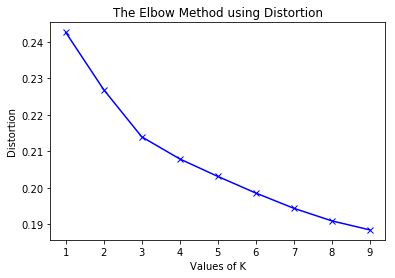

In [34]:
# Elbow method using distortion
plt.plot(K, distortions, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Distortion') 
plt.title('The Elbow Method using Distortion') 
plt.show()

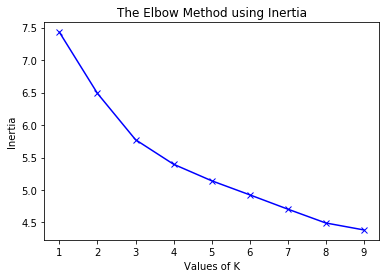

In [35]:
# Elbow method using inertia
plt.plot(K, inertias, 'bx-') 
plt.xlabel('Values of K') 
plt.ylabel('Inertia') 
plt.title('The Elbow Method using Inertia') 
plt.show()

To determine the optimal number of clusters, we have to select the value of k at the "elbow" or the point after which the distortion/inertia start decreasing in a linear fashion.

Although somewhat hard to tell, we can estimate that for both distortion and inertia that 3 clusters looks to be the elbow point so the optimal number of clusters for the *sf_grouped_clustering* data is **3**. Now, run the K-means to cluster the neighborhoods into 3 clusters.

In [36]:
# Set number of clusters
kclusters = 3

# Run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(sf_grouped_clustering)

# Check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 2], dtype=int32)

Create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.


In [37]:
# Add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

sf_merged = neighborhoods_data

# Merge sf_grouped with venues_df to add latitude/longitude for each neighborhood
sf_merged = sf_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

sf_merged # check the last columns!

,Neighborhood,Geometry,Centroid,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Seacliff,"[[[-122.49345526799993, 37.78351817100008], [-...","(-122.48727411196657, 37.78794365720007)",-122.487274,37.787944,0,Beach,Grocery Store,Mexican Restaurant,College Academic Building,Resort,Sushi Restaurant,Karaoke Bar,Salon / Barbershop,Bike Shop,Café
1,Lake Street,"[[[-122.48715071499993, 37.783785427000055], [...","(-122.48056858607683, 37.78615137738468)",-122.480569,37.786151,0,Automotive Shop,Dentist's Office,Café,Grocery Store,Office,Mexican Restaurant,Pizza Place,Sushi Restaurant,Resort,Cocktail Bar
2,Presidio National Park,"[[[-122.47758017099994, 37.81099311300005], [-...","(-122.46797365011281, 37.79926798262909)",-122.467974,37.799268,1,Office,Park,Beach,American Restaurant,Women's Store,Food Truck,National Park,Public Art,Café,Bike Shop
3,Presidio Terrace,"[[[-122.47241052999993, 37.787346539000055], [...","(-122.46795748666659, 37.78692981188894)",-122.467957,37.786930,0,Office,Salon / Barbershop,Park,Doctor's Office,Coffee Shop,Café,Real Estate Office,Fast Food Restaurant,Sporting Goods Shop,Burmese Restaurant
4,Inner Richmond,"[[[-122.47262578999994, 37.786314806000064], [...","(-122.46875409127264, 37.7811122254546)",-122.468754,37.781112,0,Chinese Restaurant,Dentist's Office,Automotive Shop,Bar,Asian Restaurant,Salon / Barbershop,Korean Restaurant,Pizza Place,Food & Drink Shop,Grocery Store
5,Sutro Heights,"[[[-122.50310471599994, 37.78129638200005], [-...","(-122.5103125329411, 37.77849858770594)",-122.510313,37.778499,0,Beach,American Restaurant,Dentist's Office,Salon / Barbershop,Café,Parking,Park,National Park,Doctor's Office,Seafood Restaurant
6,Lincoln Park / Ft. Miley,"[[[-122.49332613999991, 37.781742992000034], [...","(-122.50664372871994, 37.78286910624006)",-122.506644,37.782869,0,Beach,Park,Office,Café,Miscellaneous Shop,National Park,Motel,Bed & Breakfast,Parking,Nightclub
7,Outer Richmond,"[[[-122.51316127599989, 37.77500805900007], [-...","(-122.49827151035285, 37.77628271764712)",-122.498272,37.776283,0,Chinese Restaurant,Café,Salon / Barbershop,Vietnamese Restaurant,Dentist's Office,Bakery,Japanese Restaurant,Sporting Goods Shop,Shipping Store,Sandwich Place
8,Golden Gate Park,"[[[-122.51314054099993, 37.771331115000066], [...","(-122.47751731949992, 37.76880603476197)",-122.477517,37.768806,2,Park,Mexican Restaurant,Automotive Shop,Office,Bar,Chinese Restaurant,Shoe Store,Doctor's Office,Salon / Barbershop,Dentist's Office
9,Presidio Heights,"[[[-122.45945744099993, 37.789497924000045], [...","(-122.4514778962999, 37.789739140600055)",-122.451478,37.789739,0,Dentist's Office,Salon / Barbershop,Doctor's Office,Cosmetics Shop,Miscellaneous Shop,Women's Store,Gift Shop,Jewelry Store,Park,Antique Shop


Finally, visualize the resulting clusters.

In [38]:
# Create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=12)

# Generate choropleth map using the total number of commerce venues of each neighborhood
folium.Choropleth(geo_data=f_data,
                  data=sf_grouped_sum,
                  columns=['Neighborhood', 'Total'],
                  key_on='feature.properties.name',
                  fill_color='YlGnBu', 
                  fill_opacity=0.7, 
                  line_opacity=0.2,
                  legend_name='Number of commerce venues',
                  reset=True).add_to(map_clusters)

# Set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# Add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(sf_merged['Latitude'], sf_merged['Longitude'], sf_merged['Neighborhood'], sf_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker([lat, lon],
                        radius=5,
                        popup=label,
                        color=rainbow[cluster-1],
                        fill=True,
                        fill_color=rainbow[cluster-1],
                        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

#### 3.6.3 Examine the Clusters

Now, we can examine each cluster to determine the discriminating venue categories that distinguish each cluster. The clusters are:

Cluster | Color      
-----|-----------------
0    |	red   
1    |	purple   
2    |	green  

#### Cluster 0

In [39]:
sf_merged.loc[sf_merged['Cluster Labels'] == 0, sf_merged.columns[[0] + list(range(5, sf_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Seacliff,0,Beach,Grocery Store,Mexican Restaurant,College Academic Building,Resort,Sushi Restaurant,Karaoke Bar,Salon / Barbershop,Bike Shop,Café
1,Lake Street,0,Automotive Shop,Dentist's Office,Café,Grocery Store,Office,Mexican Restaurant,Pizza Place,Sushi Restaurant,Resort,Cocktail Bar
3,Presidio Terrace,0,Office,Salon / Barbershop,Park,Doctor's Office,Coffee Shop,Café,Real Estate Office,Fast Food Restaurant,Sporting Goods Shop,Burmese Restaurant
4,Inner Richmond,0,Chinese Restaurant,Dentist's Office,Automotive Shop,Bar,Asian Restaurant,Salon / Barbershop,Korean Restaurant,Pizza Place,Food & Drink Shop,Grocery Store
5,Sutro Heights,0,Beach,American Restaurant,Dentist's Office,Salon / Barbershop,Café,Parking,Park,National Park,Doctor's Office,Seafood Restaurant
6,Lincoln Park / Ft. Miley,0,Beach,Park,Office,Café,Miscellaneous Shop,National Park,Motel,Bed & Breakfast,Parking,Nightclub
7,Outer Richmond,0,Chinese Restaurant,Café,Salon / Barbershop,Vietnamese Restaurant,Dentist's Office,Bakery,Japanese Restaurant,Sporting Goods Shop,Shipping Store,Sandwich Place
9,Presidio Heights,0,Dentist's Office,Salon / Barbershop,Doctor's Office,Cosmetics Shop,Miscellaneous Shop,Women's Store,Gift Shop,Jewelry Store,Park,Antique Shop
10,Laurel Heights / Jordan Park,0,Salon / Barbershop,Coffee Shop,Dentist's Office,Office,Insurance Office,Pet Store,Sushi Restaurant,Automotive Shop,Furniture / Home Store,Doctor's Office
11,Lone Mountain,0,College Administrative Building,College Residence Hall,General College & University,College Cafeteria,College Academic Building,College Lab,College Library,College Science Building,College Theater,College Gym


#### Cluster 1

In [40]:
sf_merged.loc[sf_merged['Cluster Labels'] == 1, sf_merged.columns[[0] + list(range(5, sf_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Presidio National Park,1,Office,Park,Beach,American Restaurant,Women's Store,Food Truck,National Park,Public Art,Café,Bike Shop
17,Telegraph Hill,1,Office,Parking,Business Service,Fabric Shop,Park,Doctor's Office,Comfort Food Restaurant,Public Art,Seafood Restaurant,Dumpling Restaurant
18,Downtown / Union Square,1,Office,Clothing Store,Salon / Barbershop,Tailor Shop,Women's Store,Doctor's Office,Food Truck,Jewelry Store,Shoe Store,Accessories Store
29,Rincon Hill,1,Office,Harbor / Marina,Clothing Store,Jewelry Store,Sandwich Place,Burger Joint,Dive Bar,Parking,Corporate Coffee Shop,Miscellaneous Shop
31,South of Market,1,Office,Nightclub,Mexican Restaurant,Cocktail Bar,Café,Karaoke Bar,Furniture / Home Store,Cosmetics Shop,Miscellaneous Shop,Leather Goods Store
33,Mission Bay,1,Office,Park,Public Art,Pier,Coffee Shop,Harbor / Marina,Food Truck,Parking,Farmers Market,Fast Food Restaurant
34,Yerba Buena Island,1,Office,Harbor / Marina,Beach,Grocery Store,Park,Hardware Store,Café,Diner,Food Truck,Theme Park
47,Midtown Terrace,1,Office,Hookah Bar,Cocktail Bar,Flower Shop,Caribbean Restaurant,Food Truck,Latin American Restaurant,New American Restaurant,Real Estate Office,Parking
50,Upper Market,1,Office,Parking,Café,Cocktail Bar,Coffee Shop,New American Restaurant,Food Truck,College Classroom,Real Estate Office,Hookah Bar
51,Dolores Heights,1,Office,Café,Cosmetics Shop,Salon / Barbershop,Restaurant,Dentist's Office,Latin American Restaurant,Bar,Nightclub,Doctor's Office


#### Cluster 2

In [41]:
sf_merged.loc[sf_merged['Cluster Labels'] == 2, sf_merged.columns[[0] + list(range(5, sf_merged.shape[1]))]]

,Neighborhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
8,Golden Gate Park,2,Park,Mexican Restaurant,Automotive Shop,Office,Bar,Chinese Restaurant,Shoe Store,Doctor's Office,Salon / Barbershop,Dentist's Office
43,Golden Gate Heights,2,Park,Office,Korean Restaurant,Bakery,Frame Store,Men's Store,Food,Thai Restaurant,Doctor's Office,Asian Restaurant
44,Forest Hill,2,Park,Office,Food,Japanese Restaurant,Bakery,Doctor's Office,Burger Joint,Sushi Restaurant,Frame Store,French Restaurant
46,Clarendon Heights,2,Park,Office,Real Estate Office,Coffee Shop,Breakfast Spot,Food Truck,Tailor Shop,Caribbean Restaurant,Italian Restaurant,College Classroom
58,Fairmount,2,Park,Office,Bed & Breakfast,Candy Store,Public Art,Cosmetics Shop,College Lab,Music Store,Dive Bar,Breakfast Spot
71,Miraloma Park,2,Park,Pizza Place,Office,Food Truck,Food,College Classroom,College Auditorium,Public Art,Grocery Store,Water Park
72,McLaren Park,2,Park,Liquor Store,Candy Store,Bed & Breakfast,Office,Resort,College Classroom,Nightclub,Mexican Restaurant,Filipino Restaurant
75,India Basin,2,Office,Park,Post Office,Food Truck,Hardware Store,Salon / Barbershop,Restaurant,Mexican Restaurant,Public Art,Liquor Store
95,Glen Park,2,Park,Grocery Store,Office,Cantonese Restaurant,Bakery,Shipping Store,Coffee Shop,Korean Restaurant,Dim Sum Restaurant,Karaoke Bar
111,Buena Vista,2,Park,Office,Parking,Nightclub,Food,Steakhouse,Bar,State / Provincial Park,Clothing Store,Café


After examining each cluster:
* Cluster 0 looks to be all the neighborhoods with varying venues as their first and second most common venues.
* Cluster 1 neighborhoods have offices as their most common venues and varying venues as their second most common venues. 
* Cluster 2 neighborhoods have parks as their most common venues and either offices or some kind of edible goods retailer/service as their second most common venues.

## 4. Results & Discussion <a name="item4"></a>

The results of the San Francisco neighborhood analysis will be discussed in this section and a list of recommended neighborhoods will be provided to answer the three location factors and satisfy JB's criterias for her restaurant.

As a recap, the three location factors that will influence the success of a business are: 
1. Whether or not the location is best suited for the business's target market.
2. The location's area traffic.
3. Whether or not the location offers easy accessibilty and visibility.

### 4.1 Satisfying the Three Location Factors

#### 4.1.1 Should Appeal to Everyone

JB's target customers are both locals and tourists. Throughout the analysis, we have been systematically trying to satisfy the first factor in that we were slowly narrowing down the list of neighborhoods that have both locals and tourists. So now, let's finally identify the neighborhoods that have the greatest diversity of commerce venues.

To do this, drop all the lines that have a zero to ensure that at least one of all commerce venues is within the neighborhood.

In [42]:
sf_grouped_sum2 = sf_grouped_sum[(sf_grouped_sum[['Business Offices','Colleges','Hotels','Public Areas','Restaurants','Shopping Areas','Social Places']] !=0).all(axis=1)]
sf_grouped_sum2

,Neighborhood,Business Offices,Colleges,Hotels,Public Areas,Restaurants,Shopping Areas,Social Places,Total
0,Alamo Square,2,1,1,2,4,2,1,13
20,Cow Hollow,3,1,7,2,5,5,3,26
50,Laurel Heights / Jordan Park,12,1,1,1,6,8,2,31
55,Lower Nob Hill,12,1,3,3,11,3,1,34
58,McLaren Park,1,2,1,4,6,2,2,18
66,Mission Dolores,3,2,1,2,4,4,1,17
114,Westwood Highlands,6,2,1,2,9,2,2,24


And here we are. The list of neighborhoods with every type of commerce venue we just generated will help us to fulfill all three location factors. 

The existence of business offices, colleges, and hotels in the neighborhood will guarantee that there are always hungry locals and tourists in the area searching for food while the public areas, restaurants, shopping areas, and social places ensure the neighborhood is a lively area to be in. There will be enough foot and car traffic in those neighborhoods that JB will not have to worry those districts will ever be deserted.

According to the K-means cluster analysis, every neighborhood in the list, except for McLaren Park, are in cluster 0 which means they have a wide variety of venues. However, even though McLaren Park is in cluster 2, it also features offices, college class rooms, nightclubs, and various ethnic restaurants as some of its top ten most common venues. This further reinforces the three location factors. Those neighborhoods have enough venues of different kinds to attract locals and tourists to visit them, thereby increasing the people traffic. Having a sizable population of locals and tourists frequenting the area, would provide higher probabilities for JB's restaurant to be noticed because there is good chance that her restaurant will be seen by passersby (assuming that it won't be established in a dark alleyway).

The caveat to this list, however, is that there are other lively and bustling neighborhoods that could possibly be better for JB's restaurant which are not included. For example, Excelsior is also one of the most ethnically diverse districts in San Francisco. The diversity of people there, in terms of cultures, would likely provide JB with a good pool of hungry and adventurous customers. But, as this analysis simply acts as a jumping point for JB and also satisfies the three location factors, we will conclude with this list and allow JB to decide.

#### 4.1.2 Is Unique and Stands Out

To attract customers, JB wants her restaurant to be unique in the area that it's in. As such, we should suggest to her neighborhoods that <u>do not</u> have either Indian or Italian restaurants within them to maximize JB's restaurant's uniqueness.

First, list all of the neighborhoods with Indian and/or Italian restaurants.

In [43]:
indian_italian_restaurants_df = restaurants_df[restaurants_df['Venue Category'].isin(['Indian Restaurant', 'Italian Restaurant', 'Pizza Place'])]
indian_italian_restaurants_df = indian_italian_restaurants_df.groupby("Neighborhood")['Venue Category'].count().reset_index()
indian_italian_restaurants_df.rename(columns={'Venue Category': 'Indian/Italian Restaurants Count'}, inplace=True)
indian_italian_restaurants_df

,Neighborhood,Indian/Italian Restaurants Count
0,Ashbury Heights,1
1,Balboa Terrace,1
2,Bernal Heights,4
3,Castro,3
4,Cathedral Hill,1
5,Cayuga,1
6,Clarendon Heights,1
7,Cole Valley,1
8,Crocker Amazon,1
9,Eureka Valley,2


Then, find all of the neighborhoods with at least one of all commerce venues that are <u>not</u> in the above list.

In [44]:
# Left join indian_italian_restaurants_df on sf_grouped_sum2
all_commerce_neighborhoods = pd.merge(sf_grouped_sum2, indian_italian_restaurants_df, on='Neighborhood', how='left')

# Keep all rows that have NaN in the newly merged data
all_commerce_neighborhoods = all_commerce_neighborhoods[all_commerce_neighborhoods['Indian/Italian Restaurants Count'].isna()]

# Delete the column of NaN's
del all_commerce_neighborhoods['Indian/Italian Restaurants Count']

all_commerce_neighborhoods

,Neighborhood,Business Offices,Colleges,Hotels,Public Areas,Restaurants,Shopping Areas,Social Places,Total
0,Alamo Square,2,1,1,2,4,2,1,13
1,Cow Hollow,3,1,7,2,5,5,3,26
2,Laurel Heights / Jordan Park,12,1,1,1,6,8,2,31
4,McLaren Park,1,2,1,4,6,2,2,18


Now, we see all of the previously recommended neighborhoods that do not have either an Indian or Italian restaurant. This list of four neighborhoods will be great for JB to start exploring because they are bustling neighborhoods (as described in section *4.1.1*) and the lack of Indian and Italian restaurants will maximize JB's restaurant's uniqueness in the area.

#### 4.1.3 Will Primarily Serve Lunch and Dinner

Although our data does not have information that can explicitly answer this criteria, we can deduce from the list of recommended neighborhoods in section *4.1.2* that those neighborhoods are busy throughout the day. This is because all of the commerce venues are obviously openned at least during mornings and afternoons. There would be employees from the business offices that would want to order lunch on weekdays while the students from the colleges and anyone else who are living, shopping, or socializing in the area will no doubt be searching for food throughout the day, on any day.

#### 4.1.4 Will Be Moderately Priced

Once again, our data does not have any information that can directly address this fourth criteria but we can make educated assumptions that people who live in, work in, and/or frequent the recommended neighborhoods will most likely have enough money to eat at JB's restaurant. For example, according to *Wikipedia*, the demographics of Alamo Square include many young people and upper-middle-class homeowners, Laurel Heights is an upper-middle-class suburban neighborhood, and Cow Hollow is a generally affluent neighborhood. Therefore, it wouldn't be unusual for JB to open a moderately priced restaurant in the list of recommended neighborhoods.

## 5. Conclusion <a name="item5"></a>

The purpose of this project was to identify several neighborhoods in San Francisco for JB to start exploring for her Indian-Italian fusion cuisine restaurant. Only the three location factors as described in the *Background* section of this notebook were used to determine the list of recommended neighborhoods. In the analysis, we systematically checked off each of JB's criterias while also satisfying the three location factors. For example, we found the locations of every Indian and Italian restaurant in San Francisco to search for neighborhoods that can maximize JB's restaurant's uniqueness. Each commerce venue was grouped into the larger commerce venue categories of: Business Offices, Colleges, Hotels, Public Areas, Restaurants, Shopping Areas, and Social Places. This subdivision allowed us to analyze what commerce types each neighborhood is generally known for. Finally, we narrowed the list of neighborhoods to the four most promising ones for JB which include Alamo Square, Cow Hollow, Laurel Heights, and McLaren Park. Although these four neighborhoods are the recommended ones, it should be noted that there are other neighborhoods that may just be as fitting for JB to look into. Ultimately, this analysis will act as a starting point for JB and it will be up to her to make the final decision.

## Bibliography

DataSF. (2019). *SF Find Neighborhoods*. [Data set].
    https://data.sfgov.org/Geographic-Locations-and-Boundaries/SF-Find-Neighborhoods/pty2-tcw4

Foursquare. (2019). [Data set]. https://foursquare.com/

Gupta, Alind. (2019, June 6). *Elbow Method for optimal value of k in KMeans*. GeeksforGeeks.
    https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/

*Why the Locations of Your Restaurant is So Important*. TigerChef.
    https://www.tigerchef.com/why-the-location-of-your-business-is.html